Теперь решаем задачу регрессии - предскажем цены на недвижимость. Использовать датасет https://www.kaggle.com/c/house-prices-advanced-regression-techniques/data (train.csv)  
Данных немного, поэтому необходимо использовать 10-fold кросс-валидацию для оценки качества моделей  
Построить случайный лес, вывести важность признаков  
Обучить стекинг как минимум 3х моделей, использовать хотя бы 1 линейную модель и 1 нелинейную  
Для валидации модели 2-го уровня использовать отдельный hold-out датасет, как на занятии  
Показать, что использование ансамблей моделей действительно улучшает качество (стекинг vs другие модели сравнивать на hold-out)

In [302]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_profiling
from sklearn.preprocessing import StandardScaler  

In [362]:
data = pd.read_csv('train.csv')

In [292]:
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [45]:
pandas_profiling.ProfileReport(data)

In [363]:
# удаляю столбцы в которых пропущено или значение ноль, больше 50% данных

data = data.drop(['2ndFlrSF', '3SsnPorch', 'Alley', 'BsmtFinSF2', 'EnclosedPorch', 'Fence', 'LowQualFinSF', 'MasVnrArea',
                  'MiscFeature', 'MiscVal', 'PoolArea', 'PoolQC', 'ScreenPorch', 'WoodDeckSF', 'MasVnrType', 'Id'], axis=1)


In [161]:
pandas_profiling.ProfileReport(data)

In [364]:
# выделяю списки категориальных признаков и числовых

categorical_columns = [c for c in data.columns if data[c].dtype.name == 'object']
numerical_columns   = [c for c in data.columns if data[c].dtype.name != 'object']
print(categorical_columns)
print(numerical_columns)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']
['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'OpenPorchSF', 'MoSold', 'YrSold', 'SalePrice']


In [365]:
# категориальные признаки пропущенные значения обозначаю как None, числовым пропущенным 0

for i in categorical_columns:
    data[i].fillna('None')
    
for j in numerical_columns:
    data[j].fillna(0)

In [103]:
from sklearn.preprocessing import LabelEncoder

In [366]:
data[categorical_columns].head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,...,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,...,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,...,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,...,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,...,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal


In [367]:
# перевожу категориальные признаки в числовые категории

for i in categorical_columns:
    try:
        le = LabelEncoder()
        data[i] = le.fit_transform(data[i])
    except:
        continue

In [368]:
categorical_last = [c for c in data.columns if data[c].dtype.name == 'object']

In [369]:
data = data.drop(categorical_last, axis=1)

In [370]:
data = data.fillna(0)

In [392]:
# разделим данные на чем обучаемся и что предсказать
X = data.drop(['SalePrice'], axis=1)
y = data.SalePrice

In [393]:
# Поделим на train и тест
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [333]:
# построим модель случайный лес
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

In [394]:
clf = RandomForestRegressor(n_estimators=10)
clf = clf.fit(X_train, y_train)

In [401]:
# оценка качества через кросс валидацию

scores = cross_val_score(clf, X_train, y_train, cv=10)
print(f'Оценка качества модели: {scores.mean():.2f}')

Оценка качества модели: 0.83


In [417]:
y_pred = clf.predict(X_test)
from sklearn.metrics import r2_score
print(f'R2 score: {r2_score(y_test, y_pred):.2f}')

R2 score: 0.83


Text(0.5, 1.0, 'Variable Importance')

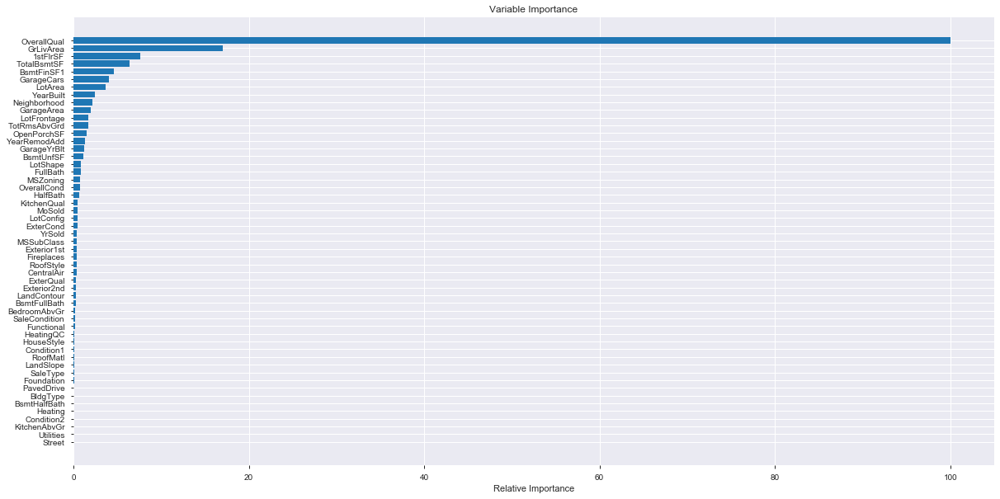

In [397]:
# смотрим важность параметров в модели

feature_importance = clf.feature_importances_
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
plt.figure(figsize=(20,10))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, data.columns[sorted_idx])

супер важным во всей модели получился почему то признак отделки недвижимости

In [402]:
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import StackingRegressor

In [404]:
# определяем модели которые будут учавствовать в обучениях

estimators = [('linear', LinearRegression()), 
              ('svr', SVR()),
              ('tree', DecisionTreeRegressor())]

In [405]:
# для стекинга определяем конечную модель, которая будет собирать предсказания всех моделей и давать итоговый ответ

main = StackingRegressor(estimators=estimators, final_estimator=RandomForestRegressor(random_state=42))

In [407]:
# обучаем модель

main.fit(X_train, y_train)

StackingRegressor(cv=None,
                  estimators=[('linear',
                               LinearRegression(copy_X=True, fit_intercept=True,
                                                n_jobs=None, normalize=False)),
                              ('svr',
                               SVR(C=1.0, cache_size=200, coef0=0.0, degree=3,
                                   epsilon=0.1, gamma='scale', kernel='rbf',
                                   max_iter=-1, shrinking=True, tol=0.001,
                                   verbose=False)),
                              ('tree',
                               DecisionTreeRegressor(ccp_alpha=0.0,
                                                     criterion='mse',
                                                     max_depth=None,
                                                     max_fe...
                  final_estimator=RandomForestRegressor(bootstrap=True,
                                                        ccp_alpha=0.0

In [418]:
y_pred_main = main.predict(X_test)
from sklearn.metrics import r2_score
print(f'R2 score: {r2_score(y_test, y_pred_main):.2f}')

R2 score: 0.76


In [409]:
scores = cross_val_score(main, X_train, y_train, cv=10)

In [416]:
print(f'Оценка качества модели: {scores.mean():.2f}')

Оценка качества модели: 0.86
